# 
#### 

# Characterizing the Depth and Scope of Trade Agreements

## I. Introduction

In [2]:
import graph_tool.all as gt
import graph_tool.stats as gt_stats
import matplotlib
import matplotlib.colors as colors
from matplotlib.font_manager import FontProperties
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
from matplotlib.pyplot import clf, xlabel, ylabel, imshow, colorbar, savefig
import pandas as pd
import numpy as np
from scipy import stats
import seaborn as sns
import os
import math

In [3]:
os.chdir("../..")
os.getcwd()

'/Users/naveenreddy/Documents/3rd SEM/Graph/Project/network-analysis-trade-agreements-main'

## II. Data

In [4]:
pta = pd.read_excel("data/WB_Bilateral PTAs.xlsx")
pta

,cty1,iso1,cty2,iso2,year,agreement,entry_force,type,wto_plus_ftaindustrial,wto_plus_ftaagriculture,...,wto_X_politicaldialogue_le,wto_X_publicadministration_le,wto_X_regionalcooperation_le,wto_X_researchandtechnology_le,wto_X_sme_le,wto_X_socialmatters_le,wto_X_statistics_le,wto_X_taxation_le,wto_X_terrorism_le,wto_X_visaandasylum_le
0,Angola,AGO,Burundi,BDI,1994,COMESA,1994,CU,1,1,...,0,0,0,0,0,0,0,0,0,0
1,Angola,AGO,Burundi,BDI,1995,COMESA,1994,CU,1,1,...,0,0,0,0,0,0,0,0,0,0
2,Angola,AGO,Burundi,BDI,1996,COMESA,1994,CU,1,1,...,0,0,0,0,0,0,0,0,0,0
3,Angola,AGO,Burundi,BDI,1997,COMESA,1994,CU,1,1,...,0,0,0,0,0,0,0,0,0,0
4,Angola,AGO,Burundi,BDI,1998,COMESA,1994,CU,1,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
159113,Zimbabwe,ZWE,Zambia,ZMB,2013,Southern African Development Community,2000,FTA,1,1,...,0,0,0,0,0,0,0,0,0,0
159114,Zimbabwe,ZWE,Zambia,ZMB,2014,COMESA,1994,CU,1,1,...,0,0,0,0,0,0,0,0,0,0
159115,Zimbabwe,ZWE,Zambia,ZMB,2014,Southern African Development Community,2000,FTA,1,1,...,0,0,0,0,0,0,0,0,0,0
159116,Zimbabwe,ZWE,Zambia,ZMB,2015,Southern African Development Community,2000,FTA,1,1,...,0,0,0,0,0,0,0,0,0,0


In [6]:
pta['depth'] = pta.filter(regex=r'^wto(?!.*_le$)').sum(axis=1)
pta['depth_le'] = pta.filter(regex=r'^wto_.*_le$').clip(lower=0, upper=1).abs().sum(axis=1)
pta

,cty1,iso1,cty2,iso2,year,agreement,entry_force,type,wto_plus_ftaindustrial,wto_plus_ftaagriculture,...,wto_X_regionalcooperation_le,wto_X_researchandtechnology_le,wto_X_sme_le,wto_X_socialmatters_le,wto_X_statistics_le,wto_X_taxation_le,wto_X_terrorism_le,wto_X_visaandasylum_le,depth,depth_le
0,Angola,AGO,Burundi,BDI,1994,COMESA,1994,CU,1,1,...,0,0,0,0,0,0,0,0,29,11
1,Angola,AGO,Burundi,BDI,1995,COMESA,1994,CU,1,1,...,0,0,0,0,0,0,0,0,29,11
2,Angola,AGO,Burundi,BDI,1996,COMESA,1994,CU,1,1,...,0,0,0,0,0,0,0,0,29,11
3,Angola,AGO,Burundi,BDI,1997,COMESA,1994,CU,1,1,...,0,0,0,0,0,0,0,0,29,11
4,Angola,AGO,Burundi,BDI,1998,COMESA,1994,CU,1,1,...,0,0,0,0,0,0,0,0,29,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
159113,Zimbabwe,ZWE,Zambia,ZMB,2013,Southern African Development Community,2000,FTA,1,1,...,0,0,0,0,0,0,0,0,12,10
159114,Zimbabwe,ZWE,Zambia,ZMB,2014,COMESA,1994,CU,1,1,...,0,0,0,0,0,0,0,0,29,11
159115,Zimbabwe,ZWE,Zambia,ZMB,2014,Southern African Development Community,2000,FTA,1,1,...,0,0,0,0,0,0,0,0,12,10
159116,Zimbabwe,ZWE,Zambia,ZMB,2015,Southern African Development Community,2000,FTA,1,1,...,0,0,0,0,0,0,0,0,12,10


In [7]:
# indicator variable for wto_x_le
pta['wto_x_le'] = 0
for column in pta.columns:
    if "wto_X" in column and "_le" in column:
        pta['wto_x_le'] = pta['wto_x_le'] | (pta[column] > 0)
pta['wto_x_le'] = pta['wto_x_le'].astype(int)

# indicator variable for wto_x_nonecon
non_econ = ['wto_X_environmentallaws_le', 'wto_X_audiovisual_le', 'wto_X_culturalcooperation_le', 'wto_X_health_le', 'wto_X_humanrights_le', 
            'wto_X_illicitdrugs_le', 'wto_X_moneylaundering_le', 'wto_X_politicaldialogue_le', 'wto_X_terrorism_le',
            'wto_X_dataprotection_le', 'wto_X_civilprotection_le', 'wto_X_educationandtraining_le'] # new
pta['wto_x_nonecon'] = 0
for column in pta.columns:
    if column in non_econ:
        pta['wto_x_nonecon'] = pta['wto_x_nonecon'] | (pta[column] > 0)
pta['wto_x_nonecon'] = pta['wto_x_nonecon'].astype(int)

In [8]:
regions = pd.read_excel("data/WB_regions.xls", skiprows=4, index_col=0)
regions = regions[['Economy', 'Code', 'Region_Clean', 'Income group']].dropna(subset = ['Region_Clean'])
regions

,Economy,Code,Region_Clean,Income group
x,,,,
1,Afghanistan,AFG,South Asia,Low income
2,Albania,ALB,Europe,Upper middle income
3,Algeria,DZA,Middle East & North Africa,Lower middle income
4,American Samoa,ASM,East Asia & Pacific,Upper middle income
5,Andorra,AND,Europe,High income
...,...,...,...,...
217,Zambia,ZMB,Sub-Saharan Africa,Lower middle income
218,Zimbabwe,ZWE,Sub-Saharan Africa,Lower middle income
219,Montserrat,MSR,Latin America & Caribbean,Low income


In [9]:
economy = pd.read_excel("data/WB_economys.xls")


# Filter to include only 'Country Name', 'Country Code', and '2019 GDP'
economy = economy[['Country_Name', 'Country_Code', 2015]]

# Rename the 2019 column to 'GDP'
economy = economy.rename(columns={2015: 'gdp'})

economy['log_gdp'] = np.log(economy['gdp'].replace('..', float('nan')).astype(float))
economy['log_gdp'] = economy['log_gdp'].fillna(economy['log_gdp'].min(skipna=True)) # fill NA values with minimum 

economy = economy.sort_values(by='gdp', ascending=False)
print(economy)

                  Country_Name Country_Code           gdp    log_gdp
259                      World          WLD  7.535966e+13  31.953293
95                 High income          HIC  4.977311e+13  31.538496
181               OECD members          OED  4.753667e+13  31.492523
198  Post-demographic dividend          PST  4.466977e+13  31.430318
103           IDA & IBRD total          IBT  2.798729e+13  30.962772
..                         ...          ...           ...        ...
110             Not classified          INX           NaN  17.421333
147   St. Martin (French part)          MAF           NaN  17.421333
193  Korea, Dem. People's Rep.          PRK           NaN  17.421333
254              Venezuela, RB          VEN           NaN  17.421333
255     British Virgin Islands          VGB           NaN  17.421333

[266 rows x 4 columns]


The final merged dataset _**trade_df**_ is constructed such that each observation is a unique country-pair agreement.

In [10]:
# merge datasets
trade_df = pd.merge(pta, economy, left_on='iso1', right_on='Country_Code')

trade_df = pd.merge(trade_df, regions, left_on='iso1', right_on='Code')



In [11]:
# remove duplicate pairs
trade_df['sorted_iso'] = trade_df[['iso1', 'iso2']].apply(lambda x: tuple(sorted(x)), axis=1) # country-pair tuple
trade_df = trade_df.drop_duplicates(subset=['sorted_iso', 'agreement'], keep='first')
trade_df

,cty1,iso1,cty2,iso2,year,agreement,entry_force,type,wto_plus_ftaindustrial,wto_plus_ftaagriculture,...,wto_x_nonecon,Country_Name,Country_Code,gdp,log_gdp,Economy,Code,Region_Clean,Income group,sorted_iso
0,Angola,AGO,Burundi,BDI,1994,COMESA,1994,CU,1,1,...,0,Angola,AGO,9.049642e+10,25.228576,Angola,AGO,Sub-Saharan Africa,Lower middle income,"(AGO, BDI)"
14,Angola,AGO,Botswana,BWA,2000,Southern African Development Community,2000,FTA,1,1,...,0,Angola,AGO,9.049642e+10,25.228576,Angola,AGO,Sub-Saharan Africa,Lower middle income,"(AGO, BWA)"
30,Angola,AGO,Democratic Republic of Congo,COD,1994,COMESA,1994,CU,1,1,...,0,Angola,AGO,9.049642e+10,25.228576,Angola,AGO,Sub-Saharan Africa,Lower middle income,"(AGO, COD)"
36,Angola,AGO,Democratic Republic of Congo,COD,2000,Southern African Development Community,2000,FTA,1,1,...,0,Angola,AGO,9.049642e+10,25.228576,Angola,AGO,Sub-Saharan Africa,Lower middle income,"(AGO, COD)"
60,Angola,AGO,Comoros,COM,1994,COMESA,1994,CU,1,1,...,0,Angola,AGO,9.049642e+10,25.228576,Angola,AGO,Sub-Saharan Africa,Lower middle income,"(AGO, COM)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155930,Samoa,WSM,Niue,NIU,2003,Pacific Island Countries Trade Agreement (PICTA),2003,FTA,1,1,...,0,Samoa,WSM,8.241505e+08,20.529864,Samoa,WSM,East Asia & Pacific,Upper middle income,"(NIU, WSM)"
156934,South Africa,ZAF,Zambia,ZMB,2000,Southern African Development Community,2000,FTA,1,1,...,0,South Africa,ZAF,3.467098e+11,26.571754,South Africa,ZAF,Sub-Saharan Africa,Upper middle income,"(ZAF, ZMB)"
156950,South Africa,ZAF,Zimbabwe,ZWE,2000,Southern African Development Community,2000,FTA,1,1,...,0,South Africa,ZAF,3.467098e+11,26.571754,South Africa,ZAF,Sub-Saharan Africa,Upper middle income,"(ZAF, ZWE)"
157536,Zambia,ZMB,Zimbabwe,ZWE,1994,COMESA,1994,CU,1,1,...,0,Zambia,ZMB,2.125122e+10,23.779680,Zambia,ZMB,Sub-Saharan Africa,Lower middle income,"(ZMB, ZWE)"


In [12]:
trade_df.to_excel("data/trade_networks_clean.xlsx", index=False)

In [13]:
trade_df

,cty1,iso1,cty2,iso2,year,agreement,entry_force,type,wto_plus_ftaindustrial,wto_plus_ftaagriculture,...,wto_x_nonecon,Country_Name,Country_Code,gdp,log_gdp,Economy,Code,Region_Clean,Income group,sorted_iso
0,Angola,AGO,Burundi,BDI,1994,COMESA,1994,CU,1,1,...,0,Angola,AGO,9.049642e+10,25.228576,Angola,AGO,Sub-Saharan Africa,Lower middle income,"(AGO, BDI)"
14,Angola,AGO,Botswana,BWA,2000,Southern African Development Community,2000,FTA,1,1,...,0,Angola,AGO,9.049642e+10,25.228576,Angola,AGO,Sub-Saharan Africa,Lower middle income,"(AGO, BWA)"
30,Angola,AGO,Democratic Republic of Congo,COD,1994,COMESA,1994,CU,1,1,...,0,Angola,AGO,9.049642e+10,25.228576,Angola,AGO,Sub-Saharan Africa,Lower middle income,"(AGO, COD)"
36,Angola,AGO,Democratic Republic of Congo,COD,2000,Southern African Development Community,2000,FTA,1,1,...,0,Angola,AGO,9.049642e+10,25.228576,Angola,AGO,Sub-Saharan Africa,Lower middle income,"(AGO, COD)"
60,Angola,AGO,Comoros,COM,1994,COMESA,1994,CU,1,1,...,0,Angola,AGO,9.049642e+10,25.228576,Angola,AGO,Sub-Saharan Africa,Lower middle income,"(AGO, COM)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155930,Samoa,WSM,Niue,NIU,2003,Pacific Island Countries Trade Agreement (PICTA),2003,FTA,1,1,...,0,Samoa,WSM,8.241505e+08,20.529864,Samoa,WSM,East Asia & Pacific,Upper middle income,"(NIU, WSM)"
156934,South Africa,ZAF,Zambia,ZMB,2000,Southern African Development Community,2000,FTA,1,1,...,0,South Africa,ZAF,3.467098e+11,26.571754,South Africa,ZAF,Sub-Saharan Africa,Upper middle income,"(ZAF, ZMB)"
156950,South Africa,ZAF,Zimbabwe,ZWE,2000,Southern African Development Community,2000,FTA,1,1,...,0,South Africa,ZAF,3.467098e+11,26.571754,South Africa,ZAF,Sub-Saharan Africa,Upper middle income,"(ZAF, ZWE)"
157536,Zambia,ZMB,Zimbabwe,ZWE,1994,COMESA,1994,CU,1,1,...,0,Zambia,ZMB,2.125122e+10,23.779680,Zambia,ZMB,Sub-Saharan Africa,Lower middle income,"(ZMB, ZWE)"


Below are some statistics to describe the trade agreements database. 

In [14]:
print('Number of countries: ' + str(len(pd.concat([trade_df['iso1'], trade_df['iso2']]).unique())))
print('Number of unique agreements: ' + str(len(trade_df['agreement'].unique())))
print('Number of unique pairs: ' + str(len(trade_df['sorted_iso'].unique())))
print('Years covered: ' + str(trade_df['entry_force'].min()) +  '-' + str(trade_df['entry_force'].max()))

Number of countries: 189
Number of unique agreements: 261
Number of unique pairs: 3141
Years covered: 1958-2015


In [15]:
trade_df[['depth', 'depth_le']].describe().applymap('{:,.0f}'.format)

/var/folders/xm/xlsv5rl11453swnzmxg_vpcm0000gn/T/ipykernel_33115/3837191311.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  trade_df[['depth', 'depth_le']].describe().applymap('{:,.0f}'.format)


,depth,depth_le
count,"6,351","6,351"
mean,27,24
std,11,12
min,1,0
25%,20,11
50%,33,28
75%,34,36
max,48,44


## III. Trade Agreements Networks

### A. Creating a *graph* object

In [16]:
# unique countries and country pair agreements
nodes = trade_df['iso1'].drop_duplicates()
print(nodes)
pairs = trade_df[['iso1', 'iso2', 'agreement']].drop_duplicates(keep='first')

# edge pairs as list of tuples 
pairs = list(zip(pairs.iso1, pairs.iso2))


0         AGO
467       ALB
824       AND
1328      ARE
1673      ARG
         ... 
155249    VCT
155735    VUT
155878    WSM
156934    ZAF
157536    ZMB
Name: iso1, Length: 174, dtype: object


In [17]:
# instantiate undirected Graph object
trade_graph = gt.Graph(directed=False)

In [18]:
# add nodes and edges from pairs list, create country_name and pair_name as properties
country_name = trade_graph.new_vertex_property('string')
pair_name = trade_graph.new_edge_property('object')

node_list = {}
for pair in pairs:
    for name in pair:
        if name not in node_list:
            v = trade_graph.add_vertex() #add vertex 
            node_list[name] = v #add vertex index to node dict
            country_name[v] = name #add name of vertex index as property
    e = trade_graph.add_edge(node_list[pair[0]], node_list[pair[1]]) #add edge
    pair_name[e] = (pair[0], pair[1]) #add name of pair index as property

trade_graph.vertex_properties["country_name"] = country_name
trade_graph.edge_properties["pair_name"] = pair_name

In [19]:
# network layout: position of nodes 
pos = gt.sfdp_layout(trade_graph)

The initial undirected and unweighted network is shown below.

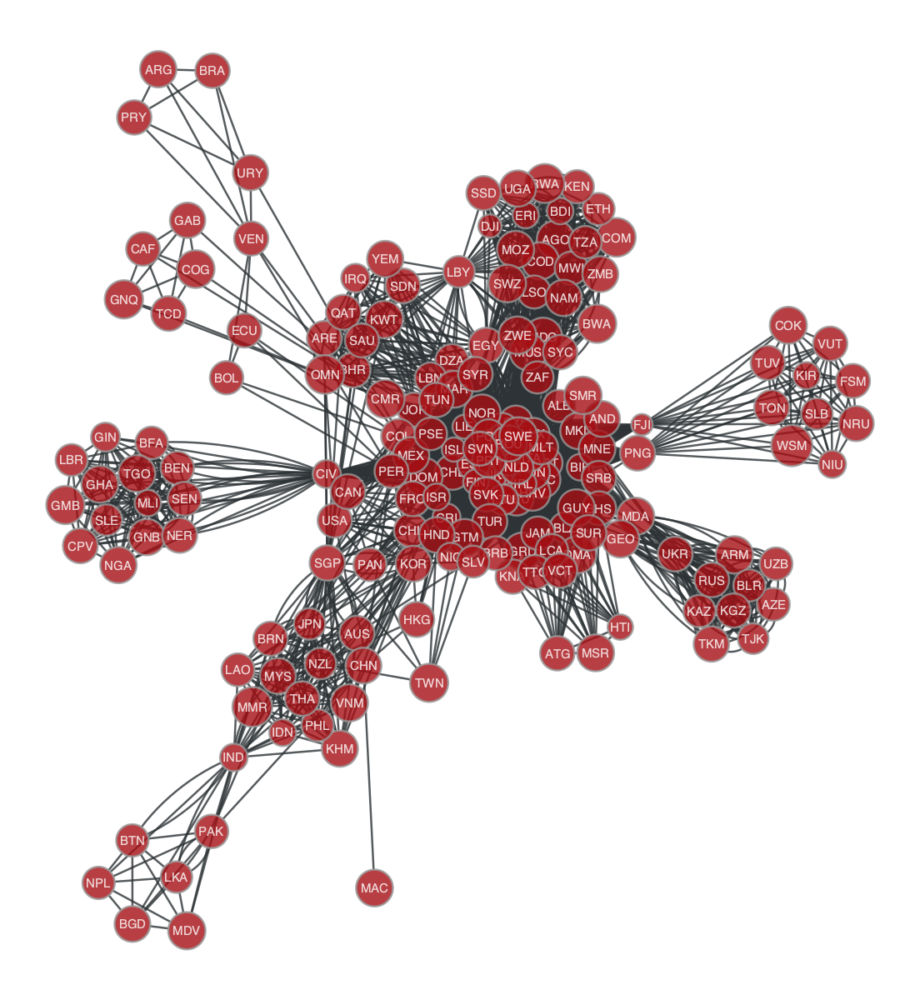

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x350f8fed0, at 0x350f8f690>

In [20]:
gt.graph_draw(trade_graph, pos = pos, vertex_text = country_name, vertex_font_family='sans serif')

### B. Node and edge properties

Other country-level and agreement-level information can also be introduced to the Graph object as node and edge properties. These properties can be used to visualize more information in the network and create sub-networks.

* **Node color**: country's geographical region
* **Node size**: economy size (i.e. Gross Domestic Product, 2019)
* **Edge weight**: trade agreement depth 
* **Edge color**: whether an agreement contains non-economic provisions 
* **Edge filter**: year when agreement was enforced 


#### i. Nodes

In [21]:
def add_node_property(node_property_type, dictionary, default_val=0):
    node_property = trade_graph.new_vertex_property(node_property_type)

    for v in trade_graph.vertices():
        name = trade_graph.vp.country_name[v]
        if name in dictionary:
            node_property[v] = dictionary[name]
        else:
            node_property[v] = default_val 
            #trade_graph.remove_vertex(v)
    return node_property

*Node color: region*

In [22]:
# list of unique country names and corresponding region
country1 = trade_df[['iso1']]
country2 = trade_df[['iso2']].rename(columns={'iso2': 'iso1'})

countries_all = pd.concat([country1, country2], ignore_index = True).drop_duplicates(keep='first')
countries_all = pd.merge(countries_all, regions, left_on='iso1', right_on='Code')[['iso1', 'Region_Clean']]

In [23]:
# region-color dictionary  
region_colors = {'Sub-Saharan Africa':'#FA9265', # orange
                 'Europe': '#7ACCE1', # blue
                 'Middle East & North Africa': '#FA9265', # orange
                 'Latin America & Caribbean': '#90BC62', # green
                 'East Asia & Pacific': '#C7448C', # pink
                 'Central Asia': '#C7448C', # pink
                 'South Asia': '#C7448C', # pink
                 'North America': '#A68FC7'} # purple

# map colors to regions
countries_all['region_colors'] = countries_all['Region_Clean'].map(region_colors)

# node color dictionary
node_color_dict = (
    countries_all[['iso1', 'region_colors']]
    .drop_duplicates()
    .set_index('iso1')
    .to_dict()['region_colors']
    )

In [24]:
node_color = add_node_property('string', node_color_dict, default_val=None)
trade_graph.vertex_properties["node_color"] = node_color

*Node filter: region*

In [25]:
# node region dictionary
node_region_dict = (
    countries_all[['iso1', 'Region_Clean']]
    .drop_duplicates()
    .set_index('iso1')
    .to_dict()['Region_Clean']
    )

In [26]:
node_region = add_node_property('string', node_region_dict, default_val=None)
trade_graph.vertex_properties["node_region"] = node_region

*Node size: economy size*

In [27]:
# node size dictionary
node_size_dict = (
    trade_df[['iso1', 'log_gdp']]
    .drop_duplicates()
    .set_index('iso1')
    .to_dict()['log_gdp']
    )

In [28]:
node_size = add_node_property('float', node_size_dict)
trade_graph.vertex_properties["node_size"] = node_size

#### ii. Edges

In [29]:
def add_edge_property(edge_property_type, dictionary, default_val=0):
    edge_property = trade_graph.new_edge_property(edge_property_type)
    for e in trade_graph.edges():
        name = trade_graph.ep.pair_name[e]
        if name in dictionary:
            edge_property[e] = dictionary[name]
        else:
            edge_property[e] = default_val
    return edge_property

*Edge weight: depth of trade agreements*

In [30]:
# define edge weight dictionary
edge_size_dict = (
    trade_df[['sorted_iso', 'depth_le']]
    .drop_duplicates()
    .set_index('sorted_iso')
    .to_dict()['depth_le']
    )

In [31]:
# add edge property
edge_weight = add_edge_property(edge_property_type='float', dictionary=edge_size_dict, default_val=0)
trade_graph.edge_properties['edge_weight'] = edge_weight

*Edge color: legal enforceability of non-economic provisions*

In [32]:
# agreement-color dictionary  
wto_colors = {1:'#FFE99F', # yellow
              0: '#424242'} # black

# map colors to agreements
trade_df['wto_colors'] = trade_df['wto_x_nonecon'].map(wto_colors)

# define edge color dictionary
edge_colors_dict = (
    trade_df[['sorted_iso', 'wto_colors']]
    .drop_duplicates()
    .set_index('sorted_iso')
    #.apply(lambda x: {'wto_colors': x['wto_colors'], 'wto_x_nonecon': x['wto_x_nonecon']}, axis=1)
    .to_dict()['wto_colors']
    )

In [33]:
edge_color = add_edge_property(edge_property_type='string', dictionary=edge_colors_dict, default_val='#EBEBEB')
trade_graph.edge_properties['edge_color'] = edge_color

*Edge filter: legal enforceability of non-economic provisions*

In [34]:
# define edge color dictionary
edge_nonecon_dict = (
    trade_df[['sorted_iso', 'wto_x_nonecon']]
    .drop_duplicates()
    .set_index('sorted_iso')
    .to_dict()['wto_x_nonecon']
    )

In [35]:
edge_nonecon_prov = add_edge_property(edge_property_type='float', dictionary=edge_nonecon_dict, default_val=0)
trade_graph.edge_properties['edge_nonecon_prov'] = edge_nonecon_prov

*Edge color: deep agreements*

In [36]:
# agreement-color dictionary  
wto_colors = {1:'#FFE99F', # yellow
              0: '#424242'} # white

# map colors to agreements
trade_df['wto_colors'] = trade_df['wto_x_le'].map(wto_colors)

# define edge color dictionary
edge_colors_dict = (
    trade_df[['sorted_iso', 'wto_colors']]
    .drop_duplicates()
    .set_index('sorted_iso')
    #.apply(lambda x: {'wto_colors': x['wto_colors'], 'wto_x_nonecon': x['wto_x_nonecon']}, axis=1)
    .to_dict()['wto_colors']
    )

In [37]:
edge_color_2 = add_edge_property(edge_property_type='string', dictionary=edge_colors_dict, default_val='#EBEBEB')
trade_graph.edge_properties['edge_color_2'] = edge_color_2

*Edge filter: deep agreements*

In [38]:
# define edge color dictionary
edge_depth_dict = (
    trade_df[['sorted_iso', 'wto_x_le']]
    .drop_duplicates()
    .set_index('sorted_iso')
    .to_dict()['wto_x_le']
    )

In [39]:
edge_depth_le = add_edge_property(edge_property_type='float', dictionary=edge_depth_dict, default_val=0)
trade_graph.edge_properties['edge_depth_le'] = edge_depth_le

*Edge filter: year agreement entry in force*

In [40]:
# define year dictionary
edge_year_dict = (
    trade_df[['sorted_iso', 'entry_force']]
    .drop_duplicates()
    .set_index('sorted_iso')
    .to_dict()['entry_force']
    )

In [41]:
edge_year= add_edge_property(edge_property_type='int', dictionary=edge_year_dict, default_val=0)
trade_graph.edge_properties['edge_year'] = edge_year

In [42]:
print(trade_graph.list_properties())

country_name          (vertex)  (type: string)
node_color            (vertex)  (type: string)
node_region           (vertex)  (type: string)
node_size             (vertex)  (type: double)
edge_color            (edge)    (type: string)
edge_color_2          (edge)    (type: string)
edge_depth_le         (edge)    (type: double)
edge_nonecon_prov     (edge)    (type: double)
edge_weight           (edge)    (type: double)
edge_year             (edge)    (type: int32_t)
pair_name             (edge)    (type: python::object)
None


### C. Plot network

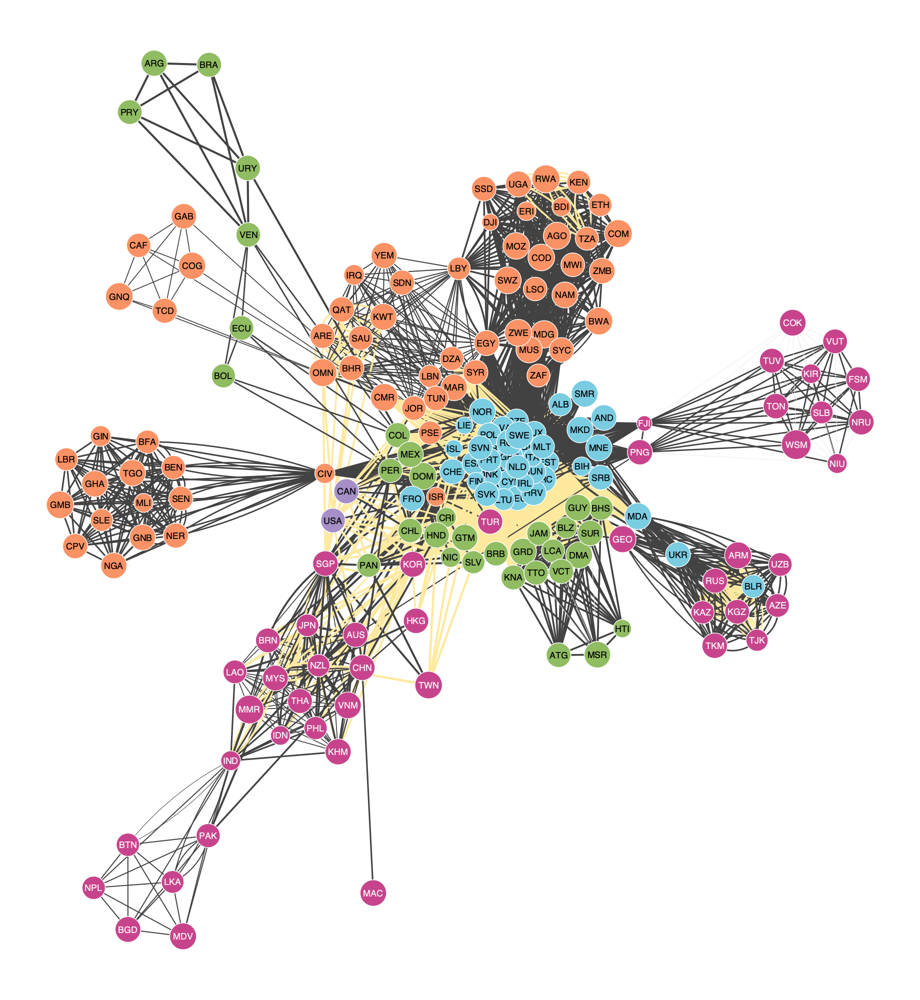

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x350f8fed0, at 0x321545a10>

In [43]:
gt.graph_draw(trade_graph, pos=pos, 
    vertex_fill_color=node_color,
    vertex_size=gt.prop_to_size(node_size, mi=5, ma=17), #size difference more visible without vertex text
    vertex_color='#FFFFFF',
    vertex_pen_width=0.7,
    vertex_anchor=0,
    vertex_font_family='sans serif',
    vertex_text=country_name,
    edge_color=edge_color,
    edge_pen_width=gt.prop_to_size(edge_weight, mi=0.5, ma=3),
    output_size=(1000,1000))
    #output="../charts/trade_complete.png")

In [44]:
print('Number of nodes: ' + str(trade_graph.num_vertices()))
print('Number of edges: ' + str(trade_graph.num_edges()))
print('Number of unique agreements: ' + str(len(trade_df['agreement'].unique())))
print('Mean depth: ' + str(round(trade_df['depth_le'].mean())))
print('Median depth: ' + str(round(trade_df['depth_le'].median())))

Number of nodes: 189
Number of edges: 6351
Number of unique agreements: 261
Mean depth: 24
Median depth: 28


In [45]:
trade_graph.save("data/trade_networks.graphml") # save graph object to data folder

## IV. Sub Graphs

In [46]:
def create_subgraph(main_graph, filter, largest=False):
    sub = gt.GraphView(main_graph, efilt=filter)

    if largest: # if true get largest connected component only 
        sub = gt.extract_largest_component(sub, prune=True)
    else:
        sub = gt.Graph(sub)
        isolated_vertices = [v for v in sub.vertices() if sub.vertex(v).out_degree() == 0 and sub.vertex(v).in_degree() == 0]
        sub.remove_vertex(isolated_vertices, fast=True)

    return sub

### A. By year

#### i. Trade agreements before 2000

In [47]:
year_filter = trade_graph.new_edge_property("bool")
year_filter.a = trade_graph.ep.edge_year.a < 2000

sg_yr1 = create_subgraph(trade_graph, year_filter)

In [48]:
pos_yr = gt.sfdp_layout(sg_yr1) # network layout 

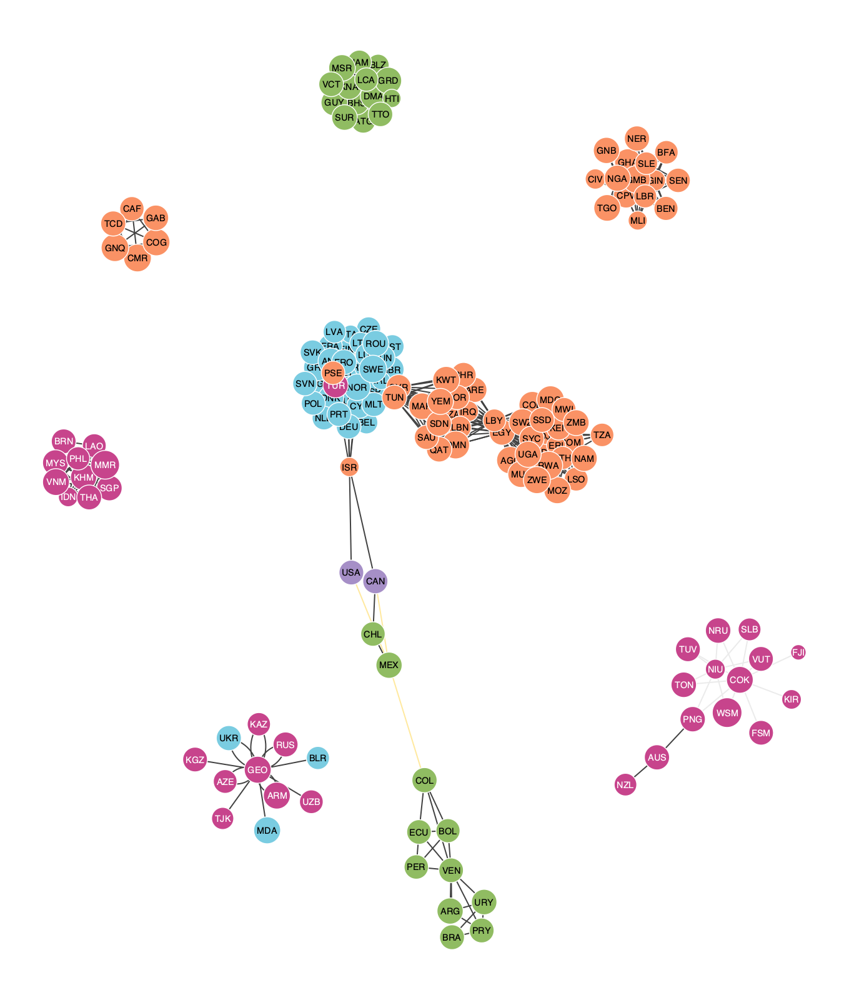

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x3215f8310, at 0x3100ce850>

In [49]:
gt.graph_draw(sg_yr1, pos=pos_yr,
            vertex_fill_color=sg_yr1.vp.node_color, 
            vertex_size=12, 
            vertex_text=sg_yr1.vp.country_name, 
            vertex_font_family='sans serif',
            vertex_anchor=0,
            vertex_color='#FFFFFF',
            vertex_pen_width=0.7,
            #edge_pen_width=gt.prop_to_size(sg_yr1.ep.edge_weight, mi=0.3, ma=3),
            edge_color=sg_yr1.ep.edge_color,
            #edge_color='#424242',
            output_size=(800,800))

In [50]:
year1 = trade_df.loc[trade_df['year'] < 2000]
print('Number of nodes: ' + str(sg_yr1.num_vertices()))
print('Number of edges: ' + str(sg_yr1.num_edges()))
print('Number of unique agreements: ' + str(len(year1['agreement'].unique())))
print('Mean depth: ' + str(round(year1['depth_le'].mean())))
print('Median depth: ' + str(round(year1['depth_le'].median())))

Number of nodes: 159
Number of edges: 1204
Number of unique agreements: 71
Mean depth: 19
Median depth: 12


In [51]:
print('Global clustering coefficient: ' + str(gt.global_clustering(sg_yr1, weight=sg_yr1.ep.edge_weight)[0]))

Global clustering coefficient: 4.918755685093792


#### ii. Trade agreements after 2000

In [52]:
year_filter = trade_graph.new_edge_property("bool")
year_filter.a = trade_graph.ep.edge_year.a >= 2000

sg_yr2 = create_subgraph(trade_graph, year_filter, largest=True)

In [53]:
pos_yr2 = gt.sfdp_layout(sg_yr2)

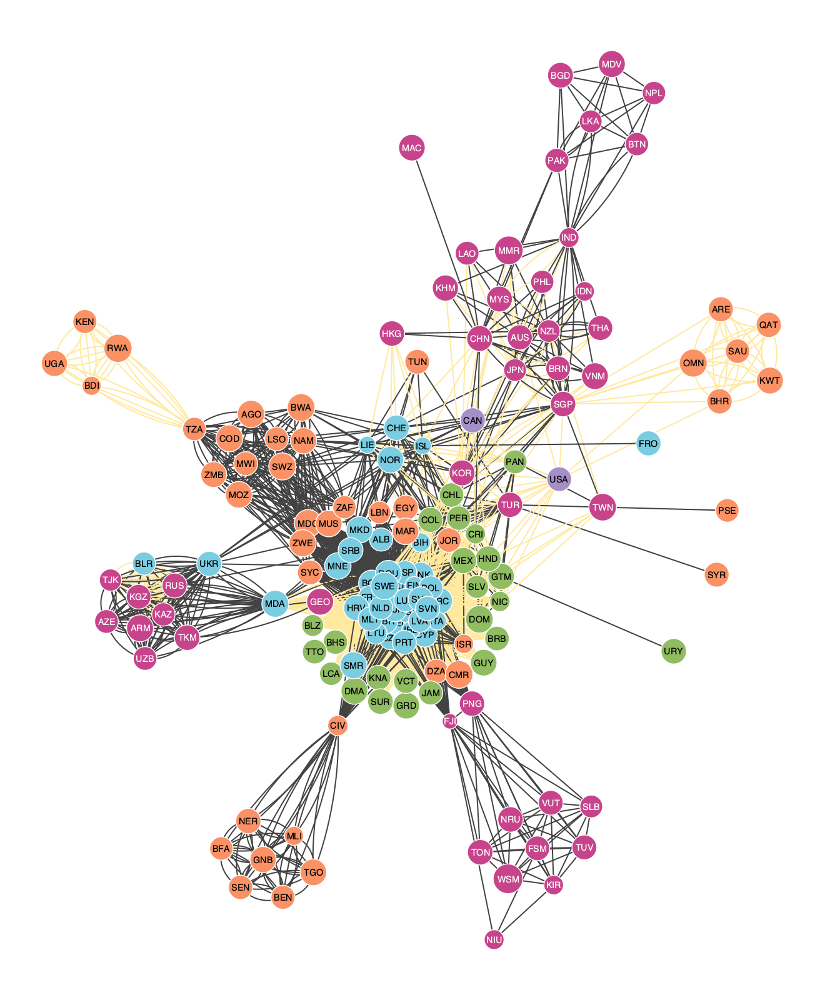

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x31fbb9510, at 0x3215f9a90>

In [54]:
gt.graph_draw(sg_yr2, pos=pos_yr2,
            vertex_fill_color=sg_yr2.vp.node_color, 
            vertex_size=12, 
            vertex_text=sg_yr2.vp.country_name, 
            vertex_font_family='sans serif',
            vertex_anchor=0,
            vertex_color='#FFFFFF',
            vertex_pen_width=0.7,
            #edge_pen_width=gt.prop_to_size(sg_yr2.ep.edge_weight, mi=0.3, ma=3),
            edge_color=sg_yr2.ep.edge_color,
            output_size=(800,800))

In [55]:
year2 = trade_df.loc[trade_df['entry_force'] >= 2000]
print('Number of nodes: ' + str(sg_yr2.num_vertices()))
print('Number of edges: ' + str(sg_yr2.num_edges()))
print('Number of unique agreements: ' + str(len(year2['agreement'].unique())))
print('Mean depth: ' + str(round(year2['depth_le'].mean())))
print('Median depth: ' + str(round(year2['depth_le'].median())))

Number of nodes: 157
Number of edges: 5147
Number of unique agreements: 190
Mean depth: 22
Median depth: 20


In [56]:
print('Global clustering coefficient: ' + str(gt.global_clustering(sg_yr2, weight=sg_yr2.ep.edge_weight)[0]))

Global clustering coefficient: 30.42465890304786


### B. By scope

In [57]:
scope_filter = trade_graph.new_edge_property("bool")
scope_filter.a = trade_graph.ep.edge_nonecon_prov.a == 1

sg_nonecon = create_subgraph(trade_graph, scope_filter)

In [58]:
pos_scope = gt.sfdp_layout(sg_nonecon)

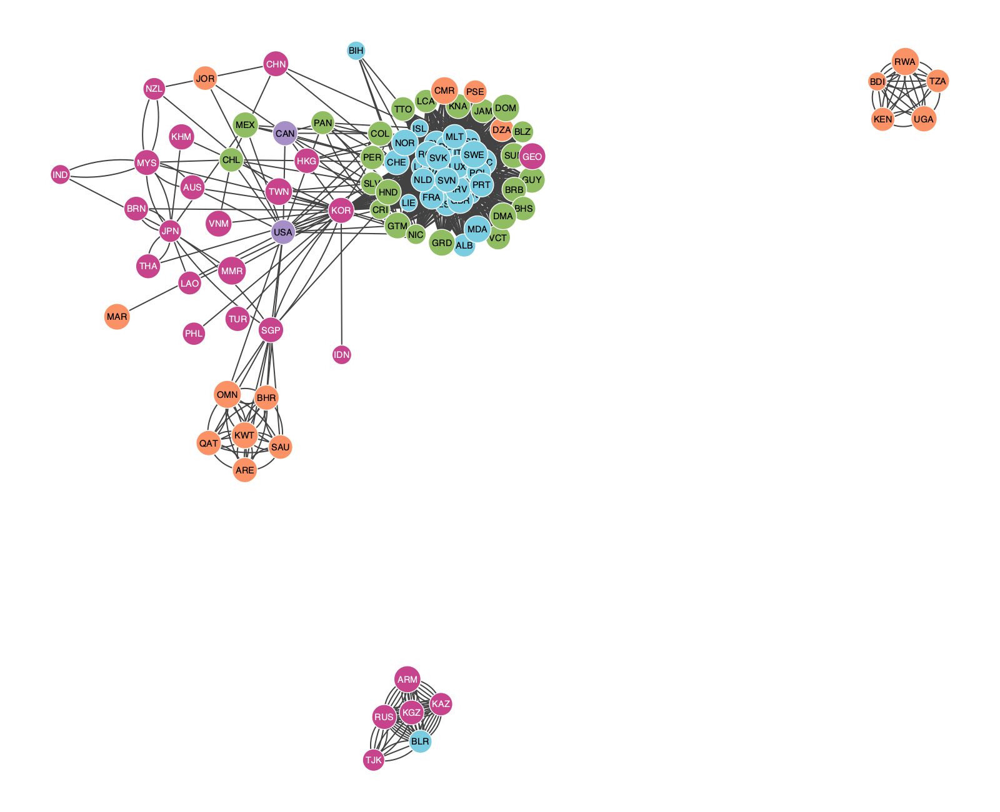

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x3215a8a50, at 0x3215fa350>

In [59]:
gt.graph_draw(sg_nonecon, pos=pos_scope,
            vertex_fill_color=sg_nonecon.vp.node_color, 
            vertex_size=12, 
            vertex_text=sg_nonecon.vp.country_name, 
            vertex_font_family='sans serif',
            vertex_anchor=0,
            vertex_color='#FFFFFF',
            vertex_pen_width=0.7,
            #edge_pen_width=gt.prop_to_size(sg_nonecon.ep.edge_weight, mi=0.3, ma=3),
            edge_color='#424242',
            output_size=(800,800))

In [60]:
nonecon = trade_df.loc[trade_df['wto_x_nonecon'] == 1]
print('Number of nodes: ' + str(sg_nonecon.num_vertices()))
print('Number of edges: ' + str(sg_nonecon.num_edges()))
print('Number of unique agreements: ' + str(len(nonecon['agreement'].unique())))
print('Mean depth: ' + str(round(nonecon['depth_le'].mean())))
print('Median depth: ' + str(round(nonecon['depth_le'].median())))

Number of nodes: 102
Number of edges: 4319
Number of unique agreements: 80
Mean depth: 31
Median depth: 35


## V. Descriptive Analysis

### A. Degree 

#### i. Degree distributions

_**Probability distribution**_

In [67]:
# create random network 
degrees = np.random.poisson(50, size=1000)
random_graph = gt.Graph(directed=False)
random_graph.add_vertex(len(degrees))
random_graph.add_edge_list(np.column_stack((np.arange(len(degrees)), degrees)), hashed=True)

<VertexPropertyMap object with value type 'int64_t', for Graph 0x16b3bcd10, at 0x300155910>

In [68]:
# degree distribution of random network
random_dist = gt.vertex_hist(random_graph, "total")

In [69]:
# degree distribution of trade network
trade_dist = gt.vertex_hist(trade_graph, "total")

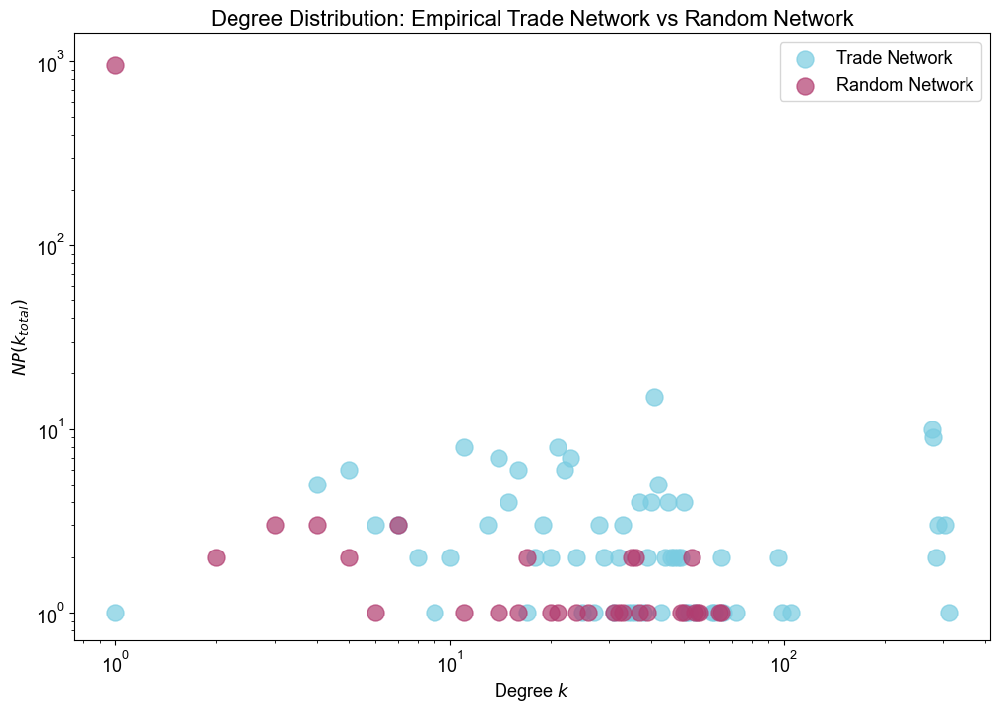

In [70]:
y = trade_dist[0]

plt.figure(figsize=(12, 8))
plt.scatter(trade_dist[1][:-1], trade_dist[0], color='#7ACCE1', s=150, alpha=0.7, label='Trade Network')
plt.scatter(random_dist[1][:-1], random_dist[0], color='#B13D70', s=150, alpha=0.7, label='Random Network')
plt.yscale("log")
plt.xscale("log")
plt.xlabel("Degree $k$", fontname='Arial', size=13)
plt.ylabel("$NP(k_{total})$", fontname='Arial', size=13)
plt.title('Degree Distribution: Empirical Trade Network vs Random Network', fontname='Arial', fontsize=16)
plt.xticks(fontname='Arial', fontsize=13)
plt.yticks(fontname='Arial', fontsize=13)
legend = plt.legend(loc='upper right', prop={'family': 'Arial', 'size': 13})

plt.show()

_**Frequency distribution**_

In [71]:
degree_array = trade_graph.degree_property_map("total").a

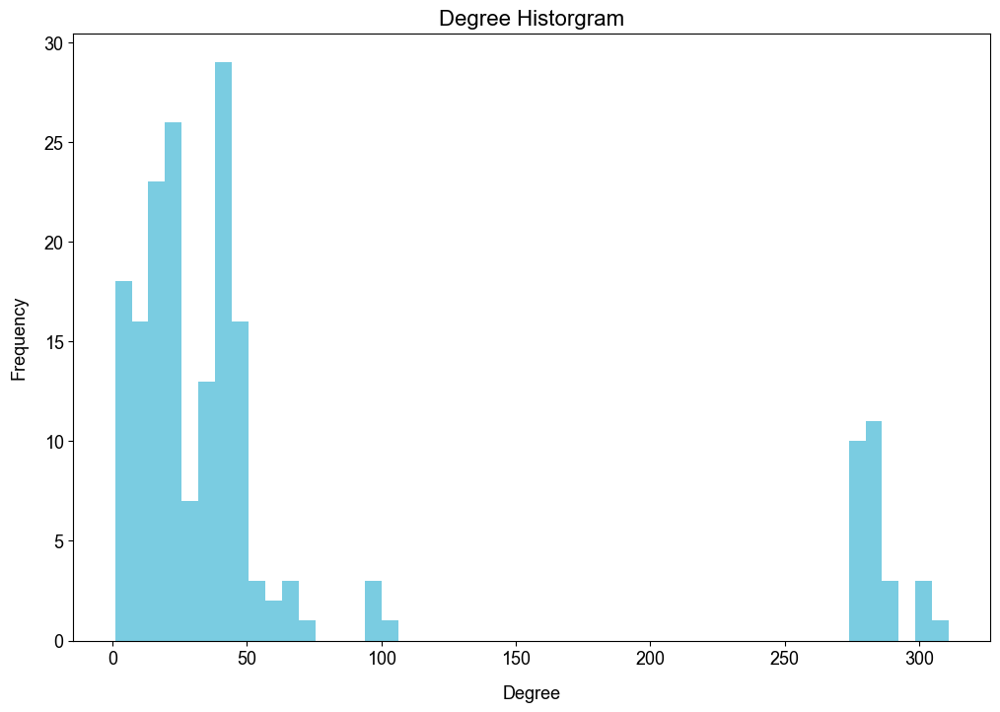

In [72]:
plt.figure(figsize=(12, 8))
plt.hist(degree_array, bins=50, color = "#7ACCE1")
plt.xlabel('Degree', labelpad=12, fontname='Arial', fontsize=13)
plt.ylabel('Frequency', labelpad=12, fontname='Arial', fontsize=13)
plt.title('Degree Historgram', fontname='Arial', fontsize=16)
plt.xticks(fontname='Arial', fontsize=13)
plt.yticks(fontname='Arial', fontsize=13)

plt.show()

In [75]:
depth_country = trade_df.groupby('iso1')['depth_le'].mean()
depth_country_df = pd.DataFrame({'country_name': depth_country.index,
                                 'ave_depth_le': depth_country.values})

degree_df = degree_df.merge(depth_country_df, on='country_name')

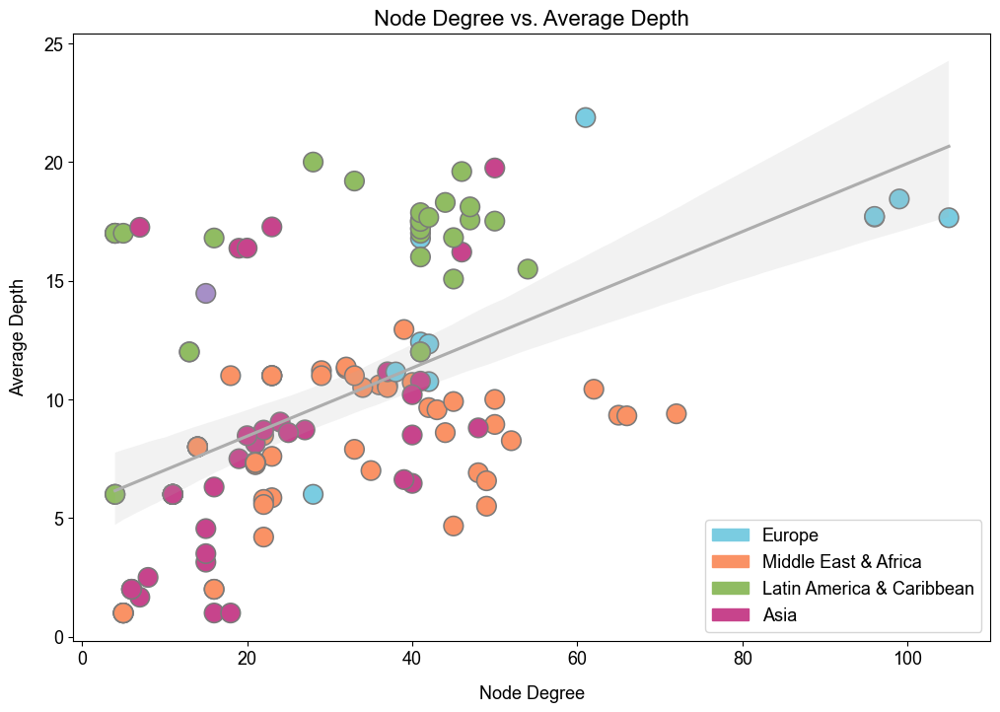

In [76]:
plot_colors = degree_df['region'].map(region_colors)

plt.figure(figsize=(12, 8))
sns.scatterplot(x='degree', y='ave_depth_le', data=degree_df, color=plot_colors, s=200, edgecolor='#7A7A7A')
sns.regplot(x='degree', y='ave_depth_le', data=degree_df, scatter=False, color='#ADADAD', robust=True)
plt.xlabel('Node Degree', labelpad=12, fontname='Arial', fontsize=13)
plt.ylabel('Average Depth', labelpad=12, fontname='Arial', fontsize=13)
plt.title('Node Degree vs. Average Depth', fontname='Arial', fontsize=16)
plt.xticks(fontname='Arial', fontsize=13)
plt.yticks(fontname='Arial', fontsize=13)

legend_colors = {'Europe': '#7ACCE1', 'Middle East & Africa': '#FA9265', 
                 'Latin America & Caribbean': '#90BC62', 'Asia': '#C7448C'}

legend_patches = [mpatches.Patch(color=color, label=region) for color, region in zip(legend_colors.values(), legend_colors.keys())]
legend = plt.legend(handles=legend_patches, loc='lower right', prop={'family': 'Arial', 'size': 13})

plt.show()


### B. Centrality 

In [77]:
color_map = colors.LinearSegmentedColormap.from_list('color_map', ['#FFFFC9', '#EA683A','#E35934', '#D53C2A', '#C71F1F'])

#### i. Full network

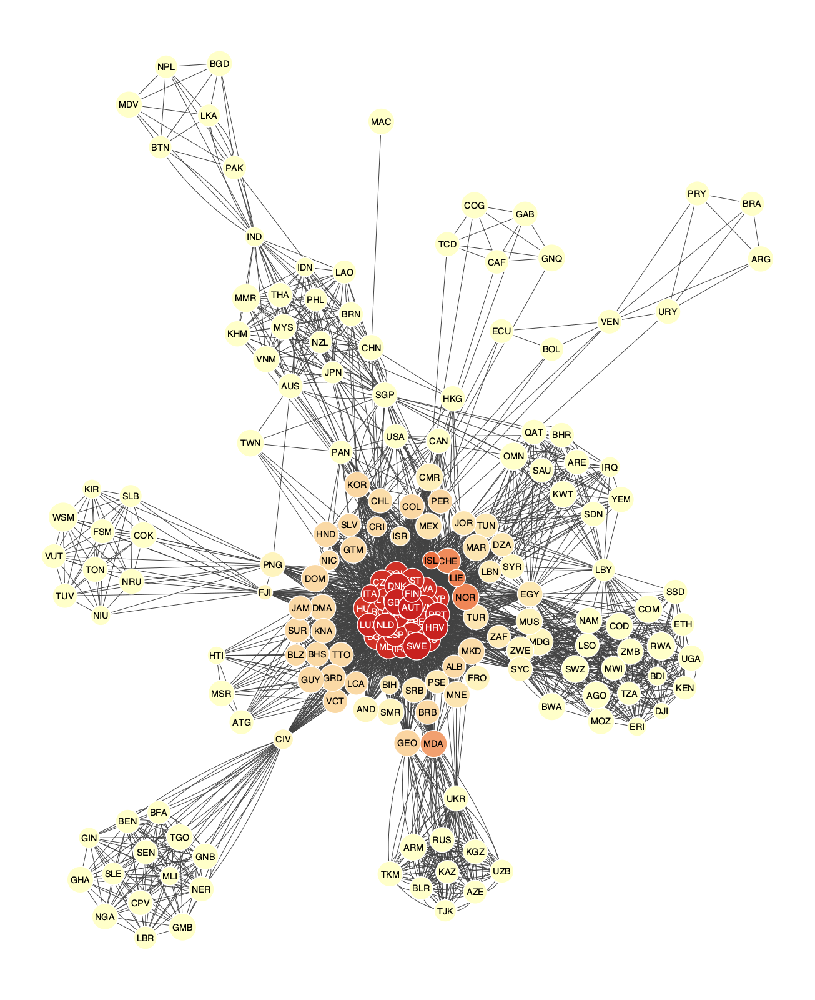

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x168df4d50, at 0x33d03a210>

In [78]:
ee, x = gt.eigenvector(trade_graph, weight=trade_graph.ep.edge_weight)

# network based on centrality
gt.graph_draw(trade_graph, pos=pos, 
              vertex_fill_color=x,
              vertex_size=12,
              vcmap=color_map,
              vertex_text=country_name, 
              vertex_font_family='sans serif',
              vertex_color='#FFFFFF',
              vertex_pen_width=0.7,
              edge_pen_width=0.5,
              edge_color='#424242',
              #edge_color=edge_color,
              vorder=x,
              output_size=(800,800))


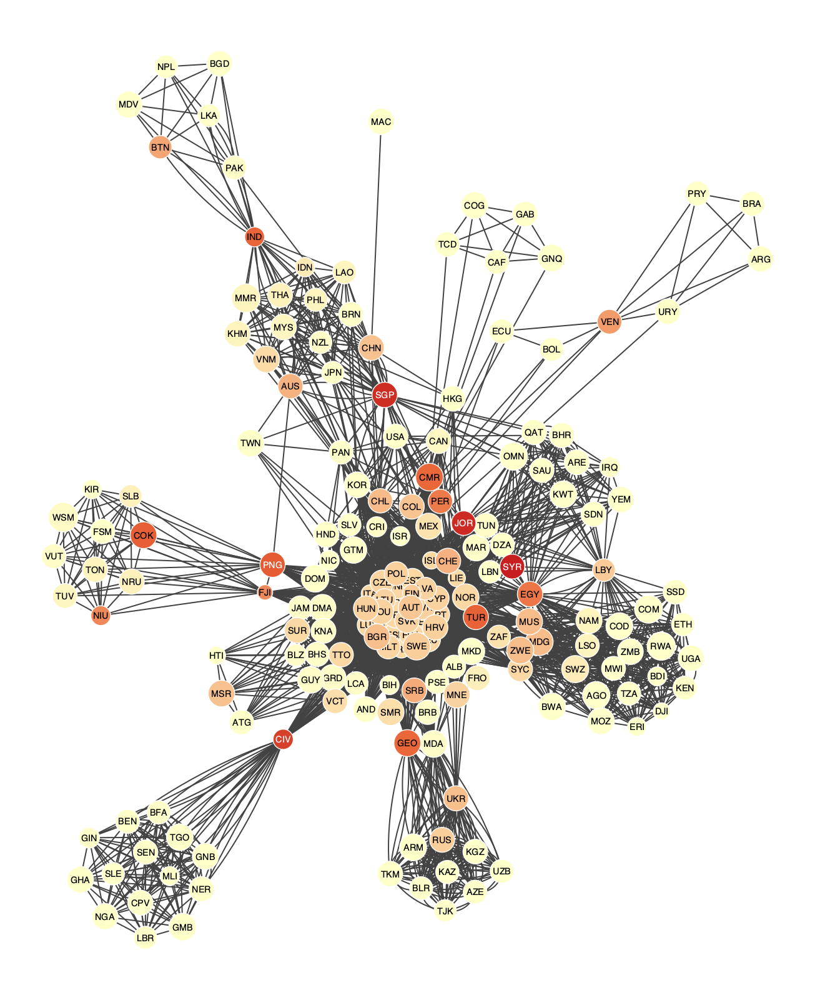

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x168df4d50, at 0x33d0c0990>

In [79]:
vp, ep = gt.betweenness(trade_graph, weight=trade_graph.ep.edge_weight)
gt.graph_draw(trade_graph, pos=pos, vertex_fill_color=vp,
              vertex_size=12,
              #edge_pen_width=gt.prop_to_size(ep, mi=0.5, ma=5),
              #edge_color=edge_color,
              edge_color='#424242',
              vcmap=color_map,
              vertex_text=country_name, 
              vertex_font_family='sans serif',
              vertex_color='#FFFFFF',
              vertex_pen_width=0.7,
              vorder=vp,
              output_size=(800,800))

### C. Community Detection 

In [140]:
def comm_block_model(graph):
    state = gt.minimize_blockmodel_dl(graph)
    membership = state.get_blocks().get_array()
    num_communities = len(set(membership))
    print("Number of communities detected: ", num_communities)
    return state, membership

In [141]:
def print_comms(graph, membership):
    community_ids = np.unique(membership)
    
    for community_id in community_ids:
        community_nodes = np.where(membership == community_id)[0]
        country_names = [graph.vp.country_name[node_id] for node_id in community_nodes]
        print(f"Community {community_id}: {country_names}")

#### i. Full network

In [142]:
trade_state, trade_mem = comm_block_model(trade_graph)

Number of communities detected:  12


Number of communities detected:  14


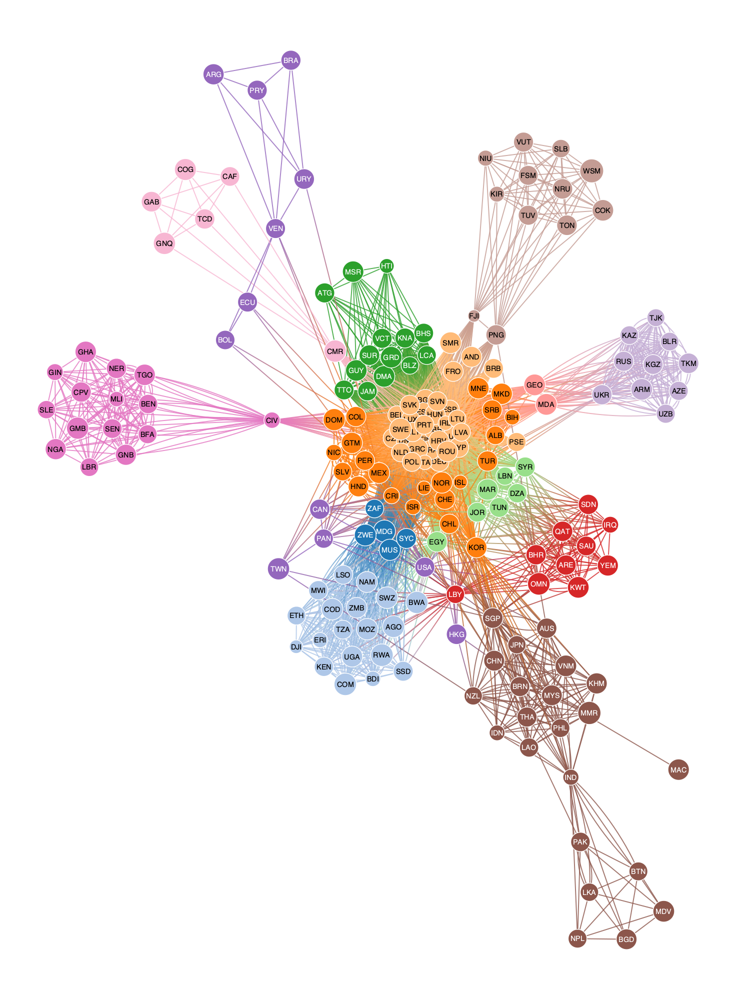

Modularity: 0.3058


In [150]:
import graph_tool.all as gt
import numpy as np
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt

# Your graph construction code goes here (as provided)

# Community detection using graph-tool's blockmodel
def comm_block_model(graph):
    state = gt.minimize_blockmodel_dl(graph)
    membership = state.get_blocks().get_array()
    num_communities = len(set(membership))
    print("Number of communities detected: ", num_communities)
    return state, membership

def print_comms(graph, membership):
    community_ids = np.unique(membership)
    for community_id in community_ids:
        community_nodes = np.where(membership == community_id)[0]
        country_names = [graph.vp.country_name[node_id] for node_id in community_nodes]
        print(f"Community {community_id}: {country_names}")

trade_state, trade_mem = comm_block_model(trade_graph)

# Generate graph-tool layout
gt_pos = gt.sfdp_layout(trade_graph)

# Visualize graph-tool communities
trade_state.draw(pos=gt_pos, 
                 vertex_size=12, 
                 vertex_text=trade_graph.vp.country_name, 
                 vertex_font_family='sans serif', 
                 vertex_color='#FFFFFF',
                 vertex_pen_width=0.7,
                 output_size=(1000,1000))

# Convert graph-tool graph to NetworkX graph
def convert_to_networkx(graph_tool_graph):
    G = nx.Graph()
    for v in graph_tool_graph.vertices():
        G.add_node(int(v), country_name=graph_tool_graph.vp.country_name[v])
    for e in graph_tool_graph.edges():
        # Use the correct edge weight property name
        G.add_edge(
            int(e.source()),
            int(e.target()),
            weight=graph_tool_graph.ep.edge_depth_le[e]
        )
    return G

# Convert the trade_graph to NetworkX format
nx_graph = convert_to_networkx(trade_graph)

# Apply the Louvain algorithm
partition = community_louvain.best_partition(nx_graph, weight='weight')

# Calculate modularity
modularity = community_louvain.modularity(partition, nx_graph, weight='weight')
print(f"Modularity: {modularity:.4f}")

# Visualize the graph with communities



In [247]:
print_comms(trade_graph, trade_mem)

Community 15: ['EGY', 'MDG', 'MUS', 'SYC', 'ZAF', 'ZWE']
Community 21: ['AGO', 'BDI', 'BWA', 'COD', 'COM', 'DJI', 'ERI', 'ETH', 'KEN', 'LSO', 'MOZ', 'MWI', 'NAM', 'RWA', 'SWZ', 'TZA', 'UGA', 'ZMB', 'SSD']
Community 33: ['ALB', 'AUT', 'BEL', 'BGR', 'CYP', 'CZE', 'DEU', 'DNK', 'ESP', 'EST', 'FIN', 'FRA', 'GBR', 'GRC', 'HRV', 'HUN', 'IRL', 'ITA', 'LTU', 'LUX', 'LVA', 'MLT', 'NLD', 'POL', 'PRT', 'ROU', 'SVK', 'SVN', 'SWE', 'TUR', 'CMR']
Community 37: ['BIH', 'MKD', 'MNE', 'SRB', 'AND', 'BLZ', 'BRB', 'COL', 'DOM', 'FRO', 'ISR', 'MEX', 'PER', 'PSE', 'SMR']
Community 61: ['ARG', 'BRA', 'PRY', 'URY', 'VEN', 'ATG', 'BHS', 'DMA', 'GRD', 'GUY', 'HTI', 'JAM', 'KNA', 'LCA', 'MSR', 'SUR', 'TTO', 'VCT', 'BOL', 'ECU']
Community 63: ['MDA', 'GEO', 'PNG', 'FJI']
Community 80: ['DZA', 'JOR', 'LBN', 'MAR', 'SYR', 'TUN']
Community 81: ['LBY', 'ARE', 'BHR', 'IRQ', 'KWT', 'OMN', 'QAT', 'SAU', 'SDN', 'YEM']
Community 95: ['ARM', 'AZE', 'BLR', 'KAZ', 'KGZ', 'RUS', 'TJK', 'TKM', 'UKR', 'UZB']
Community 125: ['S

#### ii. Agreements before 2000

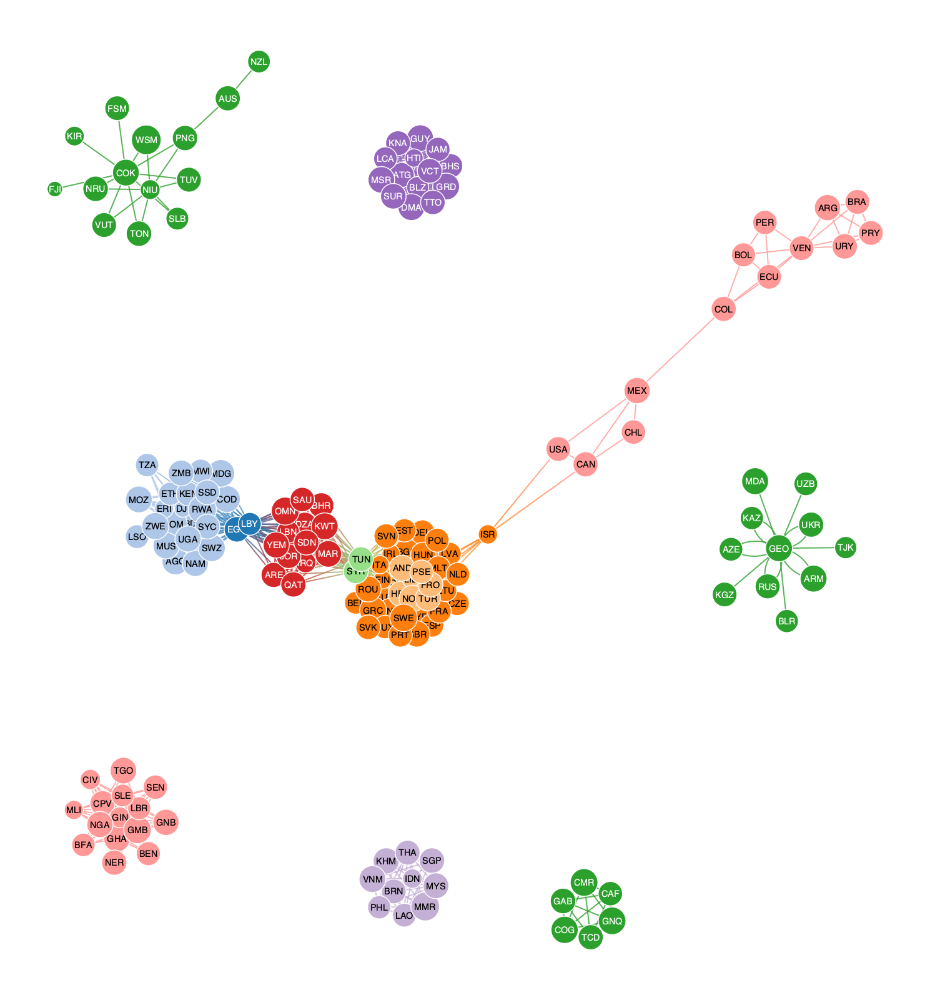

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x315b54d50, at 0x179232e50>

In [153]:
# Define a function to calculate modularity for a given graph
def calculate_modularity_for_graph(graph):
    """
    Detect communities and calculate modularity for a given graph.
    """
    # Perform community detection
    state = gt.minimize_blockmodel_dl(graph)
    membership = state.get_blocks().a  # Community assignments
    
    # Calculate modularity
    modularity = gt.modularity(graph, state.get_blocks())
    num_communities = len(set(membership))
    
    print(f"Number of communities detected: {num_communities}")
    print(f"Modularity score: {modularity:.4f}")
    return state, modularity


# Draw the refined graph for sg_yr1
sg1_state.draw(pos=pos_yr, 
               vertex_size=12, 
               vertex_text=sg_yr1.vp.country_name, 
               vertex_font_family='sans serif', 
               vertex_color='#FFFFFF',
               vertex_pen_width=0.7,
               output_size=(800, 800))




In [154]:
sg1_state, sg1_mem = comm_block_model(sg_yr1)

Number of communities detected:  10


In [155]:
print_comms(sg_yr1, sg1_mem)

Community 19: ['AGO', 'BDI', 'COD', 'COM', 'DJI', 'EGY', 'ERI', 'ETH', 'KEN', 'LBY', 'LSO', 'MDG', 'MOZ', 'MUS', 'MWI', 'NAM', 'RWA', 'SWZ', 'SYC', 'TZA', 'UGA', 'ZMB', 'ZWE', 'SSD']
Community 42: ['CHE', 'HRV', 'ISL', 'LIE', 'NOR', 'TUR', 'AND', 'FRO', 'PSE']
Community 47: ['SYR', 'TUN']
Community 61: ['AUT', 'BEL', 'BGR', 'CYP', 'CZE', 'DEU', 'DNK', 'ESP', 'EST', 'FIN', 'FRA', 'GBR', 'GRC', 'HUN', 'IRL', 'ITA', 'LTU', 'LUX', 'LVA', 'MLT', 'NLD', 'POL', 'PRT', 'ROU', 'SVK', 'SVN', 'SWE', 'ISR']
Community 78: ['SGP', 'BRN', 'IDN', 'KHM', 'LAO', 'MMR', 'MYS', 'PHL', 'THA', 'VNM']
Community 81: ['ARE', 'BHR', 'DZA', 'IRQ', 'JOR', 'KWT', 'LBN', 'MAR', 'OMN', 'QAT', 'SAU', 'SDN', 'YEM']
Community 103: ['ATG', 'BHS', 'BLZ', 'DMA', 'GRD', 'GUY', 'HTI', 'JAM', 'KNA', 'LCA', 'MSR', 'SUR', 'TTO', 'VCT']
Community 129: ['CIV', 'BEN', 'BFA', 'CPV', 'GHA', 'GIN', 'GMB', 'GNB', 'LBR', 'MLI', 'NER', 'NGA', 'SEN', 'SLE', 'TGO']
Community 140: ['ARG', 'BRA', 'PRY', 'URY', 'VEN', 'BOL', 'CHL', 'ECU', '

#### iii. Agreements after 2000

In [156]:
sg2_state, sg2_mem = comm_block_model(sg_yr2)

Number of communities detected:  13


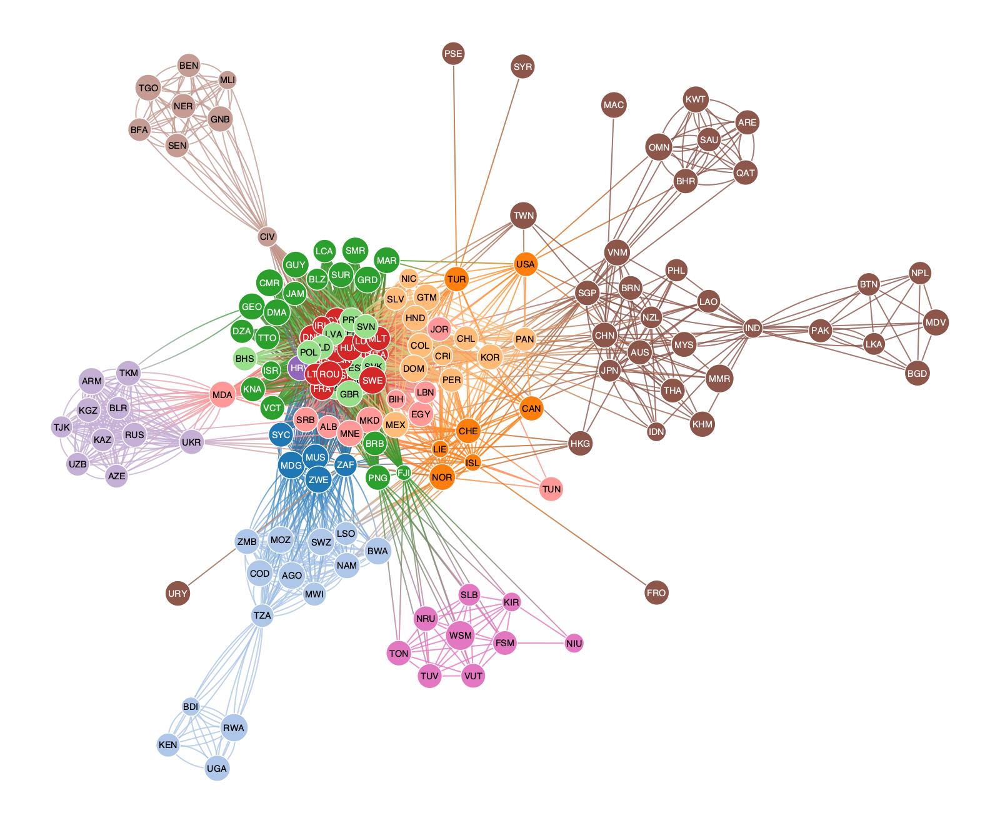

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x315b406d0, at 0x311ea8ed0>

In [157]:
sg2_state.draw(pos=pos_yr2, 
           vertex_size=12, 
           vertex_text=sg_yr2.vp.country_name, 
           vertex_font_family='sans serif', 
           vertex_color='#FFFFFF',
           vertex_pen_width=0.7,
           output_size=(800,800)
           )

In [158]:
print_comms(sg_yr2, sg2_mem)

Community 12: ['MDG', 'MUS', 'SYC', 'ZAF', 'ZWE']
Community 14: ['AGO', 'BDI', 'BWA', 'COD', 'KEN', 'LSO', 'MOZ', 'MWI', 'NAM', 'RWA', 'SWZ', 'TZA', 'UGA', 'ZMB']
Community 19: ['CHE', 'ISL', 'LIE', 'NOR', 'TUR', 'USA', 'CAN']
Community 21: ['CHL', 'KOR', 'COL', 'CRI', 'DOM', 'GTM', 'HND', 'MEX', 'NIC', 'PER', 'SLV', 'PAN']
Community 30: ['DZA', 'MAR', 'GEO', 'BLZ', 'DMA', 'GRD', 'GUY', 'JAM', 'KNA', 'LCA', 'SUR', 'TTO', 'VCT', 'PNG', 'BRB', 'CMR', 'FJI', 'ISR', 'SMR']
Community 41: ['BEL', 'CZE', 'DEU', 'EST', 'GBR', 'LVA', 'NLD', 'POL', 'PRT', 'SVK', 'SVN', 'BHS']
Community 52: ['AUT', 'BGR', 'CYP', 'DNK', 'ESP', 'FIN', 'FRA', 'GRC', 'HUN', 'IRL', 'ITA', 'LTU', 'LUX', 'MLT', 'ROU', 'SWE']
Community 53: ['EGY', 'ALB', 'BIH', 'MDA', 'MKD', 'MNE', 'SRB', 'JOR', 'LBN', 'TUN']
Community 58: ['HRV']
Community 74: ['ARM', 'AZE', 'BLR', 'KAZ', 'KGZ', 'RUS', 'TJK', 'TKM', 'UKR', 'UZB']
Community 100: ['ARE', 'BHR', 'KWT', 'OMN', 'QAT', 'SAU', 'SGP', 'SYR', 'URY', 'AUS', 'BRN', 'IDN', 'JPN', '

In [66]:
from igraph import Graph

def girvan_newman_community_detection(trade_graph):
    # Convert graph-tool graph to igraph format
    igraph_graph = Graph(directed=False)
    igraph_graph.add_vertices(trade_graph.num_vertices())
    igraph_graph.add_edges([(int(edge.source()), int(edge.target())) for edge in trade_graph.edges()])
    
    # Detect communities using Edge Betweenness
    dendrogram = igraph_graph.community_edge_betweenness()
    communities = dendrogram.as_clustering()
    modularity_score = communities.modularity
    print(f"Girvan-Newman: Number of communities detected: {len(communities)}")
    print(f"Girvan-Newman Modularity Score: {modularity_score}")
    
    return communities

# Call Girvan-Newman algorithm
girvan_newman_partition = girvan_newman_community_detection(trade_graph)


Girvan-Newman: Number of communities detected: 33
Girvan-Newman Modularity Score: 0.22401534580179744


In [65]:
pip install python-igraph


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 17.3 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.
